In [3]:
! git clone https://github.com/acolite/acolite.git

Cloning into 'acolite'...
remote: Enumerating objects: 13022, done.
remote: Counting objects: 100% (2129/2129), done.
remote: Compressing objects: 100% (346/346), done.
remote: Total 13022 (delta 1966), reused 1848 (delta 1782), pack-reused 10893 (from 3)
Receiving objects: 100% (13022/13022), 711.71 MiB | 43.51 MiB/s, done.
Resolving deltas: 100% (8336/8336), done.


In [4]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("sarahajbane/litter-windrows-batch-5")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/litter-windrows-batch-5


In [5]:


%%capture
! pip install rasterio
! pip install pyresample
! pip install netCDF4
! pip install dvc dagshub


In [6]:
import os
import sys
import rasterio
from rasterio.windows import Window
from rasterio.windows import from_bounds
from rasterio.enums import Resampling
from rasterio.transform import Affine
import shutil
import numpy as np
import tempfile
from pyproj import Transformer
import gdown
import xarray as xr
import dask
import dask.dataframe as dd
import glob
from tqdm import tqdm
import cv2
import dagshub
from dagshub.upload import Repo
import matplotlib.pyplot as plt
import pandas as pd
from glob import glob
import requests

In [7]:

ACOLITE_PATH = "./acolite"
sys.path.append(ACOLITE_PATH)
# Import acolite_run
from acolite.acolite.acolite_run import acolite_run

In [8]:
# Downloading the Littern Windrows Catalog Annotaiton from Zenodo 
record_id = "11045944"
netcdf_file_name = "WASP_LW_SENT2_MED_L1C_B_201506_202109_10m_6y_NRT_v1.0.nc" 
zenodo_url = f"https://zenodo.org/api/records/{record_id}"

# Get the actual download URL

r = requests.get(zenodo_url).json()
download_url = None

for file in r['files']:
    print(file)
    if file['key'] == netcdf_file_name:
        download_url = file['links']['self']
        break

if download_url:
    !wget -O /kaggle/working/annotations.nc {download_url}
else:
    print("File not found in Zenodo record")

{'id': '70a0084f-9051-4ff7-919b-02379570d7a3', 'key': 'WASP_LW_SENT2_MED_L1C_B_201506_202109_10m_6y_NRT_v1.0.nc', 'size': 2064602440, 'checksum': 'md5:ee45eba972fda47e226fcfffcc1cd4f3', 'links': {'self': 'https://zenodo.org/api/records/11045944/files/WASP_LW_SENT2_MED_L1C_B_201506_202109_10m_6y_NRT_v1.0.nc/content'}}
--2025-05-04 21:36:48--  https://zenodo.org/api/records/11045944/files/WASP_LW_SENT2_MED_L1C_B_201506_202109_10m_6y_NRT_v1.0.nc/content
Resolving zenodo.org (zenodo.org)... 188.185.48.194, 188.185.43.25, 188.185.45.92, ...
Connecting to zenodo.org (zenodo.org)|188.185.48.194|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2064602440 (1.9G) [application/octet-stream]
Saving to: ‘/kaggle/working/annotations.nc’

/kaggle/working/ann 100%[===================>]   1.92G  99.3MB/s    in 15s     

2025-05-04 21:37:03 (132 MB/s) - ‘/kaggle/working/annotations.nc’ saved [2064602440/2064602440]



In [11]:
from dagshub.auth import add_app_token
from kaggle_secrets import UserSecretsClient
user_secrets = UserSecretsClient()
dagshub_username = user_secrets.get_secret("DAGSHUB_USERNAME")
dagshub_token = user_secrets.get_secret("DAGSHUB_TOKEN")
add_app_token(dagshub_token)


In [13]:
! ls /kaggle/input/litter-windrows-batch-5
input_subdirs = [os.path.join('/kaggle/input', f) for f in os.listdir('/kaggle/input/') if 'windrows' in f]
if len(input_subdirs) != 0:
    safe_files_dir = input_subdirs[0]
else:
    print('No Litter Windrows Batch Dataset Found in /kaggle/input dir. Add a Litter Windrows Batch Dataset to the notebook !')


S2A_MSIL1C_20200316T100021_N0500_R122_T33TUL_20230407T214446
S2A_MSIL1C_20200319T101021_N0500_R022_T33TUL_20230628T195927
S2A_MSIL1C_20200408T101021_N0500_R022_T33TUL_20230420T020920
S2A_MSIL1C_20200415T100031_N0500_R122_T33TUL_20230508T071933
S2A_MSIL1C_20200525T100031_N0500_R122_T33TUL_20230509T083609
S2A_MSIL1C_20200617T101031_N0500_R022_T33TUL_20230429T180325
S2A_MSIL1C_20200704T100031_N0500_R122_T33TUL_20230321T061758
S2A_MSIL1C_20200714T100031_N0500_R122_T33TUL_20230423T083921
S2A_MSIL1C_20200727T101031_N0500_R022_T33TUL_20230325T162000
S2A_MSIL1C_20200813T100031_N0500_R122_T33TUL_20230508T085955
S2A_MSIL1C_20200816T101031_N0500_R022_T33TUL_20230422T024451
S2A_MSIL1C_20200823T100031_N0500_R122_T33TUL_20230507T005454
S2A_MSIL1C_20200902T100031_N0500_R122_T33TUL_20230311T202103
S2A_MSIL1C_20200905T101031_N0500_R022_T33TUL_20230418T234442
S2A_MSIL1C_20200912T100031_N0500_R122_T33TUL_20230311T041435
S2A_MSIL1C_20200915T101031_N0500_R022_T33TUL_20230415T174104
S2A_MSIL1C_20201012T1000

In [14]:
def get_utm_limit(utm_x, utm_y,utm_crs, box_meters, pixel_size=10):
    """Compute WGS84 limit from UTM center for box_meters x box_meters."""
    wgs84_crs = "EPSG:4326"
    utm_to_wgs = Transformer.from_crs(utm_crs, wgs84_crs, always_xy=True)
    
    half_box = box_meters / 2
    box_left = utm_x - half_box
    box_right = utm_x + half_box
    box_bottom = utm_y - half_box
    box_top = utm_y + half_box
    
    lon_min, lat_min = utm_to_wgs.transform(box_left, box_bottom)
    lon_max, lat_max = utm_to_wgs.transform(box_right, box_top)
    limit = [lat_min, lon_min, lat_max, lon_max]
    
    print(f"UTM box: left={box_left:.1f}, bottom={box_bottom:.1f}, right={box_right:.1f}, top={box_top:.1f}")
    print(f"WGS84 limit: {limit}")
    return limit, (box_left, box_bottom, box_right, box_top)


In [15]:
def get_dataset_tiles(safe_files_dir):
    tiles = os.listdir(safe_files_dir)
    tiles = [str(t)+'.SAFE' for t in tiles]
    return tiles

In [16]:
tiles = get_dataset_tiles(safe_files_dir)
tiles

['S2A_MSIL1C_20200316T100021_N0500_R122_T33TUL_20230407T214446.SAFE',
 'S2A_MSIL1C_20200617T101031_N0500_R022_T33TUL_20230429T180325.SAFE',
 'S2A_MSIL1C_20200816T101031_N0500_R022_T33TUL_20230422T024451.SAFE',
 'S2A_MSIL1C_20200813T100031_N0500_R122_T33TUL_20230508T085955.SAFE',
 'S2A_MSIL1C_20200915T101031_N0500_R022_T33TUL_20230415T174104.SAFE',
 'S2A_MSIL1C_20200727T101031_N0500_R022_T33TUL_20230325T162000.SAFE',
 'S2A_MSIL1C_20201012T100031_N0500_R122_T33TUL_20230309T023109.SAFE',
 'S2A_MSIL1C_20200823T100031_N0500_R122_T33TUL_20230507T005454.SAFE',
 'S2A_MSIL1C_20200319T101021_N0500_R022_T33TUL_20230628T195927.SAFE',
 'S2A_MSIL1C_20200525T100031_N0500_R122_T33TUL_20230509T083609.SAFE',
 'S2A_MSIL1C_20200704T100031_N0500_R122_T33TUL_20230321T061758.SAFE',
 'S2A_MSIL1C_20200902T100031_N0500_R122_T33TUL_20230311T202103.SAFE',
 'S2A_MSIL1C_20200912T100031_N0500_R122_T33TUL_20230311T041435.SAFE',
 'S2A_MSIL1C_20201104T101211_N0500_R022_T33TUL_20230306T145856.SAFE',
 'S2A_MSIL1C_2020071

In [17]:
def extract_crs_and_bounds(safe_file):
    #granule_path = os.path.join(os.path.join(safe_files_dir, tiles[0]), tiles[0]+'.SAFE/GRANULE/')
    granule_path = os.path.join(safe_file, 'GRANULE/')
    #print(granule_path)
    granule_subdirs = os.listdir(granule_path)  
    img_data_path = os.path.join(granule_path, os.path.join(granule_subdirs[0]),'IMG_DATA/')
    jpg2_files = os.listdir(img_data_path)
    #print('jpg2_files')
    #print(jpg2_files)
    B02_files = [f  for f in jpg2_files if f.endswith('B02.jp2')]
    #print('B02_files')
    #print(B02_files)
    band_path = os.path.join(img_data_path, B02_files[0])
    print(band_path)
    with rasterio.open(band_path) as src:
        print(f"CRS: {src.crs}")  # Should be EPSG:32631
        print(f"Bounds: {src.bounds}")  # Exact UTM coordinates
        data = src.read(1)
        print(f"B02 Valid Pixels: {np.sum(data > 0)} / {data.size}")
    return src.crs, src.bounds, src.transform, src.res


In [18]:
def get_all_tiles(files):
    """
    Given the list of the parquet annotation file, builds the list of all the 
    annotated tiles.
    """
    df = None
    # Process 10 files per batch
    batch_size = 10
    tiles = []
    for i in range(0, len(files), batch_size):
        batch_files = files[i:i + batch_size]
        
        # Read batch with Dask (lazy loading)
        ddf = dd.read_parquet(batch_files, engine='pyarrow')
        
        # Compute to pandas (triggers parallel read)
        batch_df = ddf.compute()  # Now contains data from 10 files
        tiles.append(batch_df['s2_product'].unique())
       
        print(f"Batch {i//batch_size + 1}: {len(batch_df)} rows (from {len(batch_files)} files)")
    
    tiles = np.unique(np.hstack(tiles))
    tiles = [t.decode('utf-8') for t in tiles]
    return tiles

In [19]:
def find_jp2_ref_file(safe_file):
    granule_path = os.path.join(safe_file, 'GRANULE/')
    granule_subdirs = os.listdir(granule_path)  
    img_data_path = os.path.join(granule_path, os.path.join(granule_subdirs[0]),'IMG_DATA/')
    jpg2_files = os.listdir(img_data_path)
    B02_files = [f  for f in jpg2_files if f.endswith('B02.jp2')]
    if len(B02_files) == 0:
        raise ValueError(f'No B2 band jpg2 file retrieve in the safe file {safe_file}')
    else :
        return os.path.join(img_data_path, B02_files[0])
        
def check_for_invalid_data(file_path, bbox):
    with rasterio.open(file_path) as src:
        # Read the window
        window = src.window(*bbox)
        data = src.read(1, window=window)
    
    # Sentinel-2 often uses 0 for invalid pixels
    invalid_mask = (data == 0)
    
    # Or sometimes very high values (like 65535 for uint16)
    if data.dtype == np.uint16:
        invalid_mask = invalid_mask | (data == 65535)
    
    has_invalid = invalid_mask.any()
    
    if has_invalid:
        invalid_count = invalid_mask.sum()
        print(f"Found {invalid_count} invalid pixels in the bounding box")
    else:
        print("No invalid pixels found in the bounding box")
    return has_invalid

def generate_tile_regions(safe_file_path):
    """
    Returns regions splitting the tile image
    in the form of (xmin, ymin, xmax, ymax)
    """
    w = 10980
    h = 10980
    stepx = 2700
    stepy = 2700
    sx = 3000
    sy = 3000
    regions = []
    for i in range(4):
        for j in range(4):
            regions.append((i*stepx, j*stepy, min(w, i*stepx + sx), min(h, j*stepy + sy)))
    ref_file = find_jp2_ref_file(safe_file_path)
    filtered_regions = []
   
    for r in regions :
        invalid = check_for_invalid_data(ref_file, r)
        if not invalid:
            filtered_regions.append(r)
    regions = {i : r for i, r in enumerate(filtered_regions)}
    return regions

def assign_patches(tile_regions, patches):
    splitted_regions = {}
    for p in patches: 
        for idr, r in tile_regions.items():
            inside = p[0] >= r[0] and p[1] >= r[1] and p[2] <= r[2] and p[3] <= r[3]
            if inside:
                if idr  not in splitted_regions:
                    splitted_regions[idr] = [p]
                else :
                    splitted_regions[idr].append(p)
                break
    return splitted_regions

In [20]:
def annotations_from_netcdf(target, netcdf_file_path, output_dir) :
    
    # Create output directory if it does not exist
    os.makedirs(output_dir, exist_ok=True)
    # Step 1: Open NetCDF file with optimized chunks
    try:
        # Chunk by filaments for better memory management
        ds = xr.open_dataset(netcdf_file_path, engine='netcdf4', chunks={'n_filaments': 1000})
    except Exception as e:
        print(f"Error opening NetCDF file: {e}")
        raise

    # Step 2: Create filter for target product
    selected_indices = [2, 4, 5]  
    parts = target.split('_')
    proc_target = '_'.join(parts[i] for i in selected_indices)
    print(f'Target pattern: {proc_target}')

    def is_target_product(x):
        try:
            #if isinstance(x, bytes):
            #    x = x.decode('utf-8')
            parts = str(x).strip().split('_')
            return '_'.join([parts[i] for i in selected_indices]) == proc_target
        except:
            return False

    # Step 3: Vectorized filtering
    # Convert s2_product to string format first
    s2_strings = xr.apply_ufunc(
        lambda x: str(x.decode('utf-8').strip()) if isinstance(x, bytes) else str(x).strip(),
        ds['s2_product'],
        vectorize=True,
        dask='parallelized',
        output_dtypes=[object]
    )

    # Create boolean mask
    mask = xr.apply_ufunc(
        is_target_product,
        s2_strings,
        vectorize=True,
        dask='parallelized',
        output_dtypes=[bool]
    )

    # Step 4: Apply filtering
    ds_filtered = ds.where(mask.compute(), drop=True)  # Compute mask before filtering

    # Step 5: Convert to Dask DataFrame
    df = ds_filtered[['pixel_x', 'pixel_y', 'lat_centroid', 'lon_centroid']].to_dask_dataframe()
    # Step 6: Additional filtering
    df = df[
        (df['pixel_x'] != -999) & 
        (df['pixel_y'] != -999) &
        df['pixel_x'].notnull() & 
        df['pixel_y'].notnull()
    ]

    # Step 7: Process in partitions
    filtered_chunks = []
    for partition in df.partitions:
        chunk = partition.compute()
        filtered_chunks.append(chunk)

    filtered_pandas = pd.concat(filtered_chunks)

    print(f"Final filtered DataFrame shape: {filtered_pandas.shape}")
    print(filtered_pandas.head())

    # Step 8: Save results
    output_fname = target
    if '.SAFE' in output_fname:
        output_fname = output_fname[:-5]
    output_csv = f"{output_dir}/{output_fname}_LWC_annotations.csv"
    filtered_pandas.to_csv(output_csv, index=False)
    print(f"Saved filtered DataFrame: {output_csv}")
    ds.close()
    return filtered_pandas

In [21]:
def build_tile_df(target, files):
    """
    Retrieves all annotations for a given target tile.
    """
    df = None
    # Process 10 files per batch
    batch_size = 10
    tg_id_1 = target.split('_')[2]
    tg_id_2 = '_'.join(target.split('_')[4:6])
    for i in range(0, len(files), batch_size):
        batch_files = files[i:i + batch_size]
        
        # Read batch with Dask (lazy loading)
        ddf = dd.read_parquet(batch_files, engine='pyarrow')
        
        # Compute to pandas (triggers parallel read)
        batch_df = ddf.compute()  # Now contains data from 10 files
        batch_df["s2_product"] = batch_df["s2_product"].str.decode('utf-8')
        batch_df = batch_df[batch_df["s2_product"].str.contains(tg_id_1) & batch_df["s2_product"].str.contains(tg_id_2)]
        if not batch_df.empty:
            if df is None:
                df = batch_df.copy()
            else:
                df = pd.concat([df, batch_df], ignore_index=True)
        print(f"Batch {i//batch_size + 1}: {len(batch_df)} rows (from {len(batch_files)} files)")
    return df

In [22]:
def read_tile_df(target, tile_parquet_dir):
    fpathname = os.path.join(tile_parquet_dir, f'LWR_{target[:-5]}.parquet')
    ddf = dd.read_parquet(fpathname, engine='pyarrow')
    return ddf

In [23]:
def build_tiles_parquet_annotations(tiles, files):
    """
    Retrieves all annotations for a given target tile.
    """
    for target in tiles:
        df = None
        # Process 10 files per batch
        batch_size = 10
        tg_id_1 = target.split('_')[2]
        tg_id_2 = '_'.join(target.split('_')[4:6])
        for i in range(0, len(files), batch_size):
            batch_files = files[i:i + batch_size]
            
            # Read batch with Dask (lazy loading)
            ddf = dd.read_parquet(batch_files, engine='pyarrow')
            
            # Compute to pandas (triggers parallel read)
            batch_df = ddf.compute()  # Now contains data from 10 files
            batch_df["s2_product"] = batch_df["s2_product"].str.decode('utf-8')
            batch_df = batch_df[batch_df["s2_product"].str.contains(tg_id_1) & batch_df["s2_product"].str.contains(tg_id_2)  &
    (~batch_df["pixel_x"].isna()) &
    (~batch_df["pixel_y"].isna()) &
    (batch_df["pixel_x"] != -999) &
    (batch_df["pixel_y"] != -999) ]
            if not batch_df.empty:
                if df is None:
                    df = batch_df.copy()
                else:
                    df = pd.concat([df, batch_df], ignore_index=True)
            print(f"Batch {i//batch_size + 1}: {len(batch_df)} rows (from {len(batch_files)} files)")
        # Save to Parquet
        df.to_parquet(f'LWR_{target[:-5]}.parquet')

In [25]:
def get_relative_path(target_path, start_path):
    """
    Returns the relative path from start_path to target_path
    """
    return os.path.relpath(target_path, start_path)


def get_all_files_recursive(directory):
    file_paths = []
    for root, dirs, files in os.walk(directory):
        #print(files)
        for file in files:
            full_path = os.path.abspath(os.path.join(root, file))
            if os.path.isfile(full_path):  # Check to ensure it's a file
                file_paths.append(full_path)
    return file_paths

def upload_to_dagshub(root_folder, src_folder, dst_folder, batch_id, dagshub_token):
    """
    dst_folder: Must have the format './dest_folder',
    where dst_folder is the destination folder for the images
    relative to the root of the repository.
    
    root_folder: The relative path of src_folder with respect to root_folder
    will determine the position of the uploaded file relative to the root
    of the repository.
    """

    # Defining the Repo & directory
    add_app_token(dagshub_token)
    repo = Repo("sagarbpatel31", "Plastic_Debris_Detection_3")
    ds = repo.directory(dst_folder)
    files = get_all_files_recursive(src_folder)
    print(f'uploading files {files}')
    rel_files_paths = [get_relative_path(f, src_folder) for f in files]
    print(f'relative files {rel_files_paths}')

    for i in rel_files_paths:
      ds.add(file=os.path.join(src_folder, i), path=f'./{i}')
    
    # Commit the changes
    ds.commit(f'Adding batch {batch_id}  to {dst_folder} folder', versioning='dvc')
    print(f'Uploaded batch {batch_id}')


In [26]:

# Define settings form map-mapper paper
settings = {
    # Ensure TIFF export
    'l2r_export_geotiff': True,  
    # delete .nc once made to geotiff
    'l1r_delete_netcdf' : True,
    'l2w_delete_netcdf' : True,
    'verbosity': 5,  # Detailed logging
    's2_target_res': 10,  # 10m resolution
    'resampling_method': 'nearest' , # Set to nearest neighbor
    'atmospheric_correction_method': 'dark_spectrum',
    'dsf_exclude_bands' : ['B9', 'B10'],
    # resolves issue with none type see this thread - https://odnature.naturalsciences.be/remsem/acolite-forum/viewtopic.php?t=319
    'geometry_type' : 'grids',
    #masking
    'l2w_mask' : False,
    #sunglint
    'glint_correction' : True,
    'dsf_residual_glint_correction' : True,
    'dsf_residual_glint_correction_method' : 'alternative', # index error occuring with default
    'dsf_residual_glint_wave_range' : [1500,2400],
    'glint_force_band' : None,
    'glint_mask_rhos_wave' : 1600,
    'glint_mask_rhos_threshold' : 0.11,
    'reproject' : False
}


In [27]:
def generate_tile_mask(tile_df):
    """
    Generate mask for the whole tile.
    Based on dhia's code.
    Not filtering filaments by box_dims size at the moment
    """
    mask = np.zeros((10980, 10980))
    pixels = 0
    #pb = tqdm(tile_df[tile_df["box_dims"] == 3].iterrows())
    pb = tqdm(tile_df.iterrows())
    for index, row in pb:
        x, y = row["pixel_x"], row["pixel_y"]
        if not np.isnan(x) and not np.isnan(y):
            pixels += 1
            x, y = int(x), int(y)
            mask[x, y] = 1
    return mask, pixels
    
def find_subregions_efficient(binary_image, subregion_size, threshold):
    """
    Finds regions with debris pixels in the whole tile annotation mask.
    Using integral images for large binary images.
    """
    h, w = subregion_size
    img_h, img_w = binary_image.shape
    print(f'input maks shape : {binary_image.shape}')
    # Convert to binary and create integral image
    binary = (binary_image == 1).astype(np.uint8)
    integral = cv2.integral(binary)
    
    subregions = []
    covered = np.zeros_like(binary, dtype=bool)
    
    for y in range(0, img_h - h + 1, h):
        for x in range(0, img_w - w + 1, w):
            #if covered[y:y+h, x:x+w].any():
            #    continue
                
            # Calculate sum using integral image
            total = integral[y+h, x+w] - integral[y, x+w] - integral[y+h, x] + integral[y, x]
            white_fraction = total / (h * w)
            #print(f'white_fraction {white_fraction}')
            if total > threshold:
                subregions.append((x, y,  x + w,  y + h, total))
                covered[y:y+h, x:x+w] = True
                
    return subregions

def minimal_1024_cover(small_regions):
    """
    This function could be used to find larger regions around patches
    for ACOLITE application.
    DSF algorithm could be not completely reliable applied to regions of 2560x2560 m unless
    they are very homogeneous
    """
    # Converti le coordinate in celle della griglia 256×256
    cells = set((x // 1024, y // 1024) for (y, x, _, _,_) in small_regions)
    if not cells:
        return []
    large_regions = set()
    for (i, j) in cells:
        large_i = i * 1024
        large_j = j * 1024
        large_regions.add((large_i, large_j))
    return large_regions


def upload_to_drive(file_path, drive_folder_id):
    """Upload file to Google Drive."""
    output = gdown.upload(file_path, parent_id=drive_folder_id, quiet=False)
    print(f"Uploaded {file_path} to Drive folder {drive_folder_id}")
    os.remove(file_path)  # Clear Kaggle disk

In [28]:
def validate_image(image):
    # Define invalid values (NaN, Inf, or negative)
    invalid_mask = np.isnan(image) | np.isinf(image) | (image < 0)
    total_pixels = image.size
    invalid_count = invalid_mask.sum()
    invalid_percentage = (invalid_count / total_pixels) * 100
    print(f"Percentage of invalid values (NaN, Inf, negative) across all bands: {invalid_percentage:.2f}%")
    if invalid_percentage > 10:
        print('skipping region, too many invalid pixels ')
        return False
    else :
        return True

In [29]:
def stack_bands(acolite_output_dir, stacked_dir, tile):
    # Mapping wawelength to band names
    wl_to_band  ={
        443 : 'B1',
        492 : 'B2',
        560 : 'B3',
        665 : 'B4',
        704 : 'B5',
        740 : 'B6',
        783 : 'B7',
        833 : 'B8',
        865 : 'B8A',
        1614 : 'B11',
        2202 : 'B12'
    }
    rhos_files = [f for f in os.listdir(acolite_output_dir) if 'rhos' in f and '.tif' in f]
    rhos_files = sorted(rhos_files, key=lambda x: int(x.split('_')[-1][:-4]))
    band_files = [(wl_to_band[int(f.split('_')[-1][:-4])], f) for i,f in enumerate(rhos_files) ]

    # Verify all files exist
    for band, filename in band_files:
        if not os.path.exists(os.path.join(acolite_output_dir, filename)):
            raise FileNotFoundError(f"Missing file: {filename}")

    # Reference band (use B4 for metadata, since all bands are 10m)
    reference_band = 'B4'
    reference_file = os.path.join(acolite_output_dir, [f for b, f in band_files if b == reference_band][0])

    # Open the reference GeoTIFF to get metadata
    with rasterio.open(reference_file) as ref:
        ref_profile = ref.profile
        ref_transform = ref.transform
        ref_crs = ref.crs
        ref_width = ref.width
        ref_height = ref.height
        ref_resolution = ref.res  # Should be (10.0, 10.0)

    # Initialize an array to store all bands
    stacked_data = np.zeros((len(band_files), ref_height, ref_width), dtype=np.float32)
    
    # Read each band (no resampling needed, all are 10m)
    for i, (band, filename) in enumerate(band_files):
        file_path = os.path.join(acolite_output_dir, filename)
        with rasterio.open(file_path) as src:
            # Verify resolution matches
            if src.res != ref_resolution:
                raise ValueError(f"Resolution mismatch in {filename}: expected {ref_resolution}, got {src.res}")
            # Verify dimensions match
            if src.width != ref_width or src.height != ref_height:
                raise ValueError(f"Dimensions mismatch in {filename}: expected {ref_width}x{ref_height}, got {src.width}x{src.height}")
            # Read the band
            data = src.read(1, out_dtype=np.float32)  # Single band, float32
            stacked_data[i] = data

    # Update the profile for the stacked GeoTIFF
    stacked_profile = ref_profile.copy()
    stacked_profile.update({
        'count': len(band_files),  # 11 bands
        'dtype': np.float32,  # For reflectance
        'transform': ref_transform,
        'crs': ref_crs,
        'width': ref_width,
        'height': ref_height,
        'nodata': -999  # Optional: Set nodata value (adjust if ACOLITE uses NaN)
    })
    # Determine patch name similar to MARIDA : S2_DATE_TILE_REGION in folder S2_DATE_TILE
    stacked_tif_fname =  'S2_'+('_'.join(tile.split('_')[2:-3]))+'_stacked.tiff'
    stacked_tif = os.path.join(stacked_dir, stacked_tif_fname)
    # Save the stacked GeoTIFF
    with rasterio.open(stacked_tif, 'w', **stacked_profile) as dst:
        dst.write(stacked_data)
        # Set band descriptions in the usual order
        for i, (band, _) in enumerate(band_files, 1):
            dst.set_band_description(i, band)
    
    print(f"Stacked GeoTIFF saved to: {stacked_tif}")

    # Verify the stacked GeoTIFF
    with rasterio.open(stacked_tif) as stacked:
        print(f"Stacked GeoTIFF:")
        print(f"Bounds: {stacked.bounds}")
        print(f"Dimensions: {stacked.width} columns, {stacked.height} rows")
        print(f"Resolution: {stacked.res}")
        print(f"CRS: {stacked.crs}")
        print(f"Number of bands: {stacked.count}")
        print(f"Band descriptions: {stacked.descriptions}")
    valid = validate_image(stacked_data)
    return stacked_tif, valid

In [30]:
def crop_stacked_file(stacked_tif, cropped_tif, utm_bounds, crs, tile_res):
    
    # Computing metadata for the original patch (before ACOLITE correction)
    ##########################################################
    with rasterio.open(stacked_tif) as src:
        # Calculate the window to read
        window = from_bounds(*utm_bounds, transform=src.transform)

        # Read the data in this window
        data = src.read(window=window)
    
        # Update the transform for the new cropped image
        transform = rasterio.windows.transform(window, src.transform)
    
        # Get band descriptions to preserve metadata
        band_descriptions = src.descriptions
        
        # Write the cropped image
        with rasterio.open(
            cropped_tif,
            'w',
            driver='GTiff',
            height=window.height,
            width=window.width,
            count=src.count,
            dtype=data.dtype,
            crs=src.crs,
            transform=transform,
        ) as dst:
            # Preserve band descriptions (e.g., B1, B2, ...)
            for i, desc in enumerate(band_descriptions, 1):
                if desc:  # Only set if description exists
                    dst.set_band_description(i, desc)
            dst.write(data)
    
    print(f"Cropped GeoTIFF saved to: {cropped_tif}")

    # Verify the cropped GeoTIFF
    with rasterio.open(cropped_tif) as cropped:
        print(f"Cropped GeoTIFF:")
        print(f"Bounds: {cropped.bounds}")
        print(f"Dimensions: {cropped.width} columns, {cropped.height} rows")
        print(f"Resolution: {cropped.res}")
        print(f"CRS: {cropped.crs}")
        print(f"Number of bands: {cropped.count}")
        print(f"Band descriptions: {cropped.descriptions}")


     

##### Run if you want to extract all tiles from the LW annotation file
#%%time
#all_tiles = get_all_tiles(annotations_files)


     

def process_tile(target, safe_files_dir, annotations_file, output_dir, remote_dataset_location = './LWC_DataSet/test_data', batch_id='', clean_patches = True, dagshub_token=''):
    acolite_output_dir = os.path.join(output_dir, 'acolite_output/')
    stacked_dir = os.path.join(output_dir, 'stacked/')
    final_dir = os.path.join(output_dir, 'patches/')
    os.makedirs(acolite_output_dir, exist_ok=True)
    os.makedirs(stacked_dir, exist_ok=True)
    if clean_patches : 
        shutil.rmtree(acolite_output_dir, ignore_errors=True)
    os.makedirs(final_dir, exist_ok=True)
    print(f'building annotations dataframe for tile {target}')
    #tile_df = build_tile_df(target, annotations_files)
    tile_df = annotations_from_netcdf(target, annotations_file, output_dir)
    mask, debris_pixels_count = generate_tile_mask(tile_df)
    print(f'tile mask shape {mask.shape}')
    if debris_pixels_count == 0:
        print(f'no valid debris pixels in tile {target}')
        return False
    patches = find_subregions_efficient(mask, (256, 256), 25) #### CHANGED THRESHOLD TO 25 HERE TO EXLUDE MINIMAL PLASTIC PATCHES 
    print(f'patches with marine debris : {patches}')
    target_file_path = os.path.join(os.path.join(safe_files_dir, target[:-5]), target)
    crs, bounds, tile_transform, tile_res = extract_crs_and_bounds(target_file_path)       
    print(f'crs : {crs}')
    print(f'bounds : {bounds}')
    res = tile_res[0] #sentinel 2 max resolution
    tile_regions = generate_tile_regions(target_file_path)
    patches_per_region = assign_patches(tile_regions, patches)
    print(f'patches per region {patches_per_region}')
    for i, ppr in patches_per_region.items(): #iterates over regions containing patches
        shutil.rmtree(stacked_dir, ignore_errors=True)
        os.makedirs(stacked_dir, exist_ok=True)
        current_region = tile_regions[i]
        current_center = ((current_region[0] + current_region[2])/2 * res + bounds.left,
        (current_region[1] + current_region[3])/2 * (-res) + bounds.top)
        #subregion_centers = [((int(p[1] + p[3])/2) * res + bounds.left, int((p[0] + p[2])/2) * res + bounds.bottom) for p in patches]
        print(f'region center : {current_center}')
        #subregion_size = (256 * res, 256 * res)
        current_region_size = ((current_region[2] - current_region[0]) * res, 
                               (current_region[3] - current_region[1]) * res )
        try:
            # Check disk usage
            print("Disk usage before run:")
            !du -sh /kaggle/input/*
            !df -h /kaggle/tmp /kaggle/working
        
            # Clear output directory
            shutil.rmtree(acolite_output_dir, ignore_errors=True)
            os.makedirs(acolite_output_dir, exist_ok=True)


        # Process each subregion
        #for i, (subregion_utm_x, subregion_utm_y) in enumerate(subregion_centers):
            # Clear output directory
            subregion_utm_x, subregion_utm_y = current_center
            print(f'Cleaning previous acolite output')
            shutil.rmtree(acolite_output_dir, ignore_errors=True)
            os.makedirs(acolite_output_dir, exist_ok=True)
            print(f"\nProcessing subregion {i+1}/{len(tile_regions)} centered at UTM ({subregion_utm_x}, {subregion_utm_y})")
    
            # Compute UTM-based limit
            limit, utm_box = get_utm_limit(subregion_utm_x, subregion_utm_y, crs, current_region_size[0]) #subregion_size[0])
            print(f'setting limit : {limit}')
            settings['limit'] = limit
            print(f"Settings for subregion {i+1}: {settings}")
            output_files = acolite_run(settings=settings, inputfile=target_file_path, output=acolite_output_dir)
            print(f"Generated output files {output_files}")
            print('stacking bands')
            stacked_tiff, valid = stack_bands(acolite_output_dir, stacked_dir, target)
            if not valid : 
                print(f'skipping region {current_region} : too many invalid pixels')
                continue
            patch_dir =  os.path.join(final_dir, '_'.join((stacked_tiff.split('/')[-1]).split('_')[:-1]))# '_'.join(stacked_tiff.split('_')[:-1])
            print(f'patch dir {patch_dir}')
            for p in ppr:
                print(f'cropping  patch {p}')
                patch_utm_bound = (p[0] * res + bounds.left, (p[3]) * (-res) + bounds.top,  ## CHANGED -1 removed
                                   p[2] * res + bounds.left,  p[1] * (-res) + bounds.top)
                patch_name_prefix = patch_dir.split('/')[-1]
                patch_name = f'{patch_name_prefix}_{int(patch_utm_bound[0])}_{int(patch_utm_bound[1])}.tif'  ## CHANGED one f removed from .tiff
                patch_pathname = os.path.join(patch_dir, patch_name)
                os.makedirs(patch_dir, exist_ok=True)
                print(f'patch pathname {patch_pathname}')
                crop_stacked_file(stacked_tiff, os.path.join(patch_dir, patch_pathname), patch_utm_bound, crs, tile_res)
                patch_mask = mask[p[1] : p[3], p[0] : p[2]]
                print(f'patch mask shape {patch_mask.shape}')
                try:
                    cv2.imwrite(os.path.join(patch_dir, f'{patch_pathname[:-4]}_cl.tif'), patch_mask)
                except Exception as e:
                    print(f"Error writing mask: {e}")
            # Insert Sanity Check for ACOLITE output ? 
            
            # Upload to DagsHub
            if dagshub_token:
                upload_to_dagshub(output_dir, final_dir, remote_dataset_location, batch_id, dagshub_token)
    
    

            # Final disk usage
            print("\nDisk usage after run:")
            ! du -sh /kaggle/input/*
            ! df -h /kaggle/tmp /kaggle/working
      
    
        except Exception as e:
            print(f"Exception captured: {e}")

In [32]:

def process_batch(tiles, safe_files_dir, annotations_file, batch_id='', dagshub_token=''):
    """
    tiles :  list of tiles (SAFE files) in batch batch_id
    """
    clean_patches = len(dagshub_token) != 0
    for target in tiles:
        process_tile(target, safe_files_dir, annotations_file, '/kaggle/working', batch_id, clean_patches =clean_patches, dagshub_token=dagshub_token)
    


In [33]:
process_batch(tiles,safe_files_dir, '/kaggle/working/annotations.nc',  batch_id='', dagshub_token='')


building annotations dataframe for tile S2A_MSIL1C_20200316T100021_N0500_R122_T33TUL_20230407T214446.SAFE
Target pattern: 20200316T100021_R122_T33TUL
Final filtered DataFrame shape: (145, 6)
   n_filaments  n_max_pixels_fil  pixel_x  pixel_y  lat_centroid  lon_centroid
0            0                 0   4048.0   6333.0     45.667413     13.253886
1            0                 1   4048.0   6334.0     45.667413     13.253886
2            0                 2   4049.0   6331.0     45.667413     13.253886
3            0                 3   4049.0   6332.0     45.667413     13.253886
4            0                 4   4050.0   6331.0     45.667413     13.253886
Saved filtered DataFrame: /kaggle/working/S2A_MSIL1C_20200316T100021_N0500_R122_T33TUL_20230407T214446_LWC_annotations.csv


145it [00:00, 21947.03it/s]

tile mask shape (10980, 10980)
input maks shape : (10980, 10980)


patches with marine debris : [(6144, 3840, 6400, 4096, 41), (6144, 4096, 6400, 4352, 28), (5632, 4608, 5888, 4864, 44)]
/kaggle/input/litter-windrows-batch-5/S2A_MSIL1C_20200316T100021_N0500_R122_T33TUL_20230407T214446/S2A_MSIL1C_20200316T100021_N0500_R122_T33TUL_20230407T214446.SAFE/GRANULE/L1C_T33TUL_A024715_20200316T100023/IMG_DATA/T33TUL_20200316T100021_B02.jp2
CRS: EPSG:32633
Bounds: BoundingBox(left=300000.0, bottom=4990200.0, right=409800.0, top=5100000.0)
B02 Valid Pixels: 119850218 / 120560400
crs : EPSG:32633
bounds : BoundingBox(left=300000.0, bottom=4990200.0, right=409800.0, top=5100000.0)
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the boundin

83it [00:00, 22643.89it/s]

tile mask shape (10980, 10980)
input maks shape : (10980, 10980)


patches with marine debris : [(3072, 9984, 3328, 10240, 48), (3328, 9984, 3584, 10240, 35)]
/kaggle/input/litter-windrows-batch-5/S2A_MSIL1C_20200617T101031_N0500_R022_T33TUL_20230429T180325/S2A_MSIL1C_20200617T101031_N0500_R022_T33TUL_20230429T180325.SAFE/GRANULE/L1C_T33TUL_A026045_20200617T101113/IMG_DATA/T33TUL_20200617T101031_B02.jp2
CRS: EPSG:32633
Bounds: BoundingBox(left=300000.0, bottom=4990200.0, right=409800.0, top=5100000.0)
B02 Valid Pixels: 108663288 / 120560400
crs : EPSG:32633
bounds : BoundingBox(left=300000.0, bottom=4990200.0, right=409800.0, top=5100000.0)
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels foun

2617it [00:00, 25931.99it/s]

tile mask shape (10980, 10980)
input maks shape : (10980, 10980)


patches with marine debris : [(6656, 4352, 6912, 4608, 71), (7168, 4352, 7424, 4608, 89), (7168, 4608, 7424, 4864, 31), (5632, 5120, 5888, 5376, 84), (6912, 5120, 7168, 5376, 111), (7168, 5120, 7424, 5376, 106), (7424, 5120, 7680, 5376, 60), (6912, 5376, 7168, 5632, 71), (7424, 5376, 7680, 5632, 180), (5120, 5632, 5376, 5888, 26), (5632, 5632, 5888, 5888, 34), (512, 5888, 768, 6144, 54), (7424, 5888, 7680, 6144, 49), (4352, 6144, 4608, 6400, 112), (4352, 6400, 4608, 6656, 228), (5120, 6400, 5376, 6656, 451), (4864, 6656, 5120, 6912, 85), (768, 7168, 1024, 7424, 46), (4608, 7424, 4864, 7680, 171), (2560, 8192, 2816, 8448, 39), (1536, 8448, 1792, 8704, 105), (2816, 8448, 3072, 8704, 76), (256, 10240, 512, 10496, 69)]
/kaggle/input/litter-windrows-batch-5/S2A_MSIL1C_20200816T101031_N0500_R022_T33TUL_20230422T024451/S2A_MSIL1C_20200816T101031_N0500_R022_T33TUL_20230422T024451.SAFE/GRANULE/L1C_T33TUL_A026903_20200816T101030/IMG_DATA/T33TUL_20200816T101031_B02.jp2
CRS: EPSG:32633
Bounds: Bou

1034it [00:00, 26521.71it/s]

tile mask shape (10980, 10980)
input maks shape : (10980, 10980)


patches with marine debris : [(5888, 4096, 6144, 4352, 29), (5120, 4608, 5376, 4864, 75), (5376, 4608, 5632, 4864, 82), (6656, 4608, 6912, 4864, 65), (5120, 4864, 5376, 5120, 47), (5376, 4864, 5632, 5120, 28), (4096, 5120, 4352, 5376, 47), (5888, 5120, 6144, 5376, 238), (6144, 5120, 6400, 5376, 95), (3328, 5376, 3584, 5632, 73), (4352, 5376, 4608, 5632, 28), (4864, 5376, 5120, 5632, 59), (3328, 5632, 3584, 5888, 63), (4352, 5632, 4608, 5888, 31), (4608, 5632, 4864, 5888, 40)]
/kaggle/input/litter-windrows-batch-5/S2A_MSIL1C_20200813T100031_N0500_R122_T33TUL_20230508T085955/S2A_MSIL1C_20200813T100031_N0500_R122_T33TUL_20230508T085955.SAFE/GRANULE/L1C_T33TUL_A026860_20200813T100224/IMG_DATA/T33TUL_20200813T100031_B02.jp2
CRS: EPSG:32633
Bounds: BoundingBox(left=300000.0, bottom=4990200.0, right=409800.0, top=5100000.0)
B02 Valid Pixels: 120016560 / 120560400
crs : EPSG:32633
bounds : BoundingBox(left=300000.0, bottom=4990200.0, right=409800.0, top=5100000.0)
No invalid pixels found in th

715it [00:00, 25447.42it/s]

tile mask shape (10980, 10980)
input maks shape : (10980, 10980)


patches with marine debris : [(5376, 4096, 5632, 4352, 30), (7424, 4096, 7680, 4352, 29), (5376, 4352, 5632, 4608, 56), (5376, 4608, 5632, 4864, 163), (5120, 4864, 5376, 5120, 159), (5632, 4864, 5888, 5120, 86), (4096, 5376, 4352, 5632, 31), (4352, 5376, 4608, 5632, 48), (4608, 5376, 4864, 5632, 31), (3328, 5632, 3584, 5888, 37)]
/kaggle/input/litter-windrows-batch-5/S2A_MSIL1C_20200915T101031_N0500_R022_T33TUL_20230415T174104/S2A_MSIL1C_20200915T101031_N0500_R022_T33TUL_20230415T174104.SAFE/GRANULE/L1C_T33TUL_A027332_20200915T101550/IMG_DATA/T33TUL_20200915T101031_B02.jp2
CRS: EPSG:32633
Bounds: BoundingBox(left=300000.0, bottom=4990200.0, right=409800.0, top=5100000.0)
B02 Valid Pixels: 109040005 / 120560400
crs : EPSG:32633
bounds : BoundingBox(left=300000.0, bottom=4990200.0, right=409800.0, top=5100000.0)
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No

752it [00:00, 23185.73it/s]

tile mask shape (10980, 10980)
input maks shape : (10980, 10980)


patches with marine debris : [(5632, 4096, 5888, 4352, 73), (6144, 4096, 6400, 4352, 66), (7936, 4096, 8192, 4352, 41), (5376, 4352, 5632, 4608, 104), (5632, 4352, 5888, 4608, 56), (6912, 4352, 7168, 4608, 26), (4864, 4864, 5120, 5120, 28), (5376, 4864, 5632, 5120, 32), (5632, 4864, 5888, 5120, 50), (6656, 5120, 6912, 5376, 38), (5632, 5632, 5888, 5888, 40), (5632, 5888, 5888, 6144, 73)]
/kaggle/input/litter-windrows-batch-5/S2A_MSIL1C_20200727T101031_N0500_R022_T33TUL_20230325T162000/S2A_MSIL1C_20200727T101031_N0500_R022_T33TUL_20230325T162000.SAFE/GRANULE/L1C_T33TUL_A026617_20200727T101605/IMG_DATA/T33TUL_20200727T101031_B02.jp2
CRS: EPSG:32633
Bounds: BoundingBox(left=300000.0, bottom=4990200.0, right=409800.0, top=5100000.0)
B02 Valid Pixels: 108994365 / 120560400
crs : EPSG:32633
bounds : BoundingBox(left=300000.0, bottom=4990200.0, right=409800.0, top=5100000.0)
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the 

145it [00:00, 21147.26it/s]

tile mask shape (10980, 10980)
input maks shape : (10980, 10980)


patches with marine debris : [(6912, 4096, 7168, 4352, 29), (4864, 5120, 5120, 5376, 30)]
/kaggle/input/litter-windrows-batch-5/S2A_MSIL1C_20201012T100031_N0500_R122_T33TUL_20230309T023109/S2A_MSIL1C_20201012T100031_N0500_R122_T33TUL_20230309T023109.SAFE/GRANULE/L1C_T33TUL_A027718_20201012T100412/IMG_DATA/T33TUL_20201012T100031_B02.jp2
CRS: EPSG:32633
Bounds: BoundingBox(left=300000.0, bottom=4990200.0, right=409800.0, top=5100000.0)
B02 Valid Pixels: 120054574 / 120560400
crs : EPSG:32633
bounds : BoundingBox(left=300000.0, bottom=4990200.0, right=409800.0, top=5100000.0)
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found 

555it [00:00, 24019.39it/s]

tile mask shape (10980, 10980)
input maks shape : (10980, 10980)


patches with marine debris : [(3840, 6400, 4096, 6656, 40), (3840, 7936, 4096, 8192, 28), (4352, 7936, 4608, 8192, 87), (4608, 7936, 4864, 8192, 178), (4096, 8192, 4352, 8448, 84), (512, 9472, 768, 9728, 44)]
/kaggle/input/litter-windrows-batch-5/S2A_MSIL1C_20200823T100031_N0500_R122_T33TUL_20230507T005454/S2A_MSIL1C_20200823T100031_N0500_R122_T33TUL_20230507T005454.SAFE/GRANULE/L1C_T33TUL_A027003_20200823T100307/IMG_DATA/T33TUL_20200823T100031_B02.jp2
CRS: EPSG:32633
Bounds: BoundingBox(left=300000.0, bottom=4990200.0, right=409800.0, top=5100000.0)
B02 Valid Pixels: 120037050 / 120560400
crs : EPSG:32633
bounds : BoundingBox(left=300000.0, bottom=4990200.0, right=409800.0, top=5100000.0)
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the boundi

177it [00:00, 19492.51it/s]

tile mask shape (10980, 10980)
input maks shape : (10980, 10980)


patches with marine debris : [(5120, 4352, 5376, 4608, 59)]
/kaggle/input/litter-windrows-batch-5/S2A_MSIL1C_20200319T101021_N0500_R022_T33TUL_20230628T195927/S2A_MSIL1C_20200319T101021_N0500_R022_T33TUL_20230628T195927.SAFE/GRANULE/L1C_T33TUL_A024758_20200319T101336/IMG_DATA/T33TUL_20200319T101021_B02.jp2
CRS: EPSG:32633
Bounds: BoundingBox(left=300000.0, bottom=4990200.0, right=409800.0, top=5100000.0)
B02 Valid Pixels: 109471671 / 120560400
crs : EPSG:32633
bounds : BoundingBox(left=300000.0, bottom=4990200.0, right=409800.0, top=5100000.0)
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid

1586it [00:00, 25255.09it/s]

tile mask shape (10980, 10980)
input maks shape : (10980, 10980)


patches with marine debris : [(6912, 4096, 7168, 4352, 64), (4096, 5376, 4352, 5632, 28), (5376, 5376, 5632, 5632, 32), (3840, 5632, 4096, 5888, 98), (5376, 5632, 5632, 5888, 70), (3584, 5888, 3840, 6144, 38), (6912, 6144, 7168, 6400, 38), (4096, 6400, 4352, 6656, 55), (4096, 6912, 4352, 7168, 41), (2304, 8448, 2560, 8704, 33), (3072, 8704, 3328, 8960, 30), (3328, 8960, 3584, 9216, 53), (3584, 9216, 3840, 9472, 32), (4608, 9728, 4864, 9984, 67), (5120, 9984, 5376, 10240, 32), (1024, 10240, 1280, 10496, 61), (4608, 10240, 4864, 10496, 42), (5120, 10240, 5376, 10496, 102), (4864, 10496, 5120, 10752, 139)]
/kaggle/input/litter-windrows-batch-5/S2A_MSIL1C_20200525T100031_N0500_R122_T33TUL_20230509T083609/S2A_MSIL1C_20200525T100031_N0500_R122_T33TUL_20230509T083609.SAFE/GRANULE/L1C_T33TUL_A025716_20200525T100503/IMG_DATA/T33TUL_20200525T100031_B02.jp2
CRS: EPSG:32633
Bounds: BoundingBox(left=300000.0, bottom=4990200.0, right=409800.0, top=5100000.0)
B02 Valid Pixels: 120105627 / 120560400
c

385it [00:00, 23763.24it/s]

tile mask shape (10980, 10980)
input maks shape : (10980, 10980)


patches with marine debris : [(8448, 3584, 8704, 3840, 29), (7168, 4096, 7424, 4352, 91), (7424, 4096, 7680, 4352, 56), (4864, 4608, 5120, 4864, 69), (6144, 4608, 6400, 4864, 122)]
/kaggle/input/litter-windrows-batch-5/S2A_MSIL1C_20200704T100031_N0500_R122_T33TUL_20230321T061758/S2A_MSIL1C_20200704T100031_N0500_R122_T33TUL_20230321T061758.SAFE/GRANULE/L1C_T33TUL_A026288_20200704T100635/IMG_DATA/T33TUL_20200704T100031_B02.jp2
CRS: EPSG:32633
Bounds: BoundingBox(left=300000.0, bottom=4990200.0, right=409800.0, top=5100000.0)
B02 Valid Pixels: 119895902 / 120560400
crs : EPSG:32633
bounds : BoundingBox(left=300000.0, bottom=4990200.0, right=409800.0, top=5100000.0)
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels found in the bounding box
No invalid pixels fou

KeyboardInterrupt: 

In [36]:
ls -l /kaggle/working/patches/

total 44
drwxr-xr-x 2 root root 4096 May  4 21:44 S2_20200316T100021_N0500/
drwxr-xr-x 2 root root 4096 May  4 22:25 S2_20200319T101021_N0500/
drwxr-xr-x 2 root root 4096 May  4 22:36 S2_20200525T100031_N0500/
drwxr-xr-x 2 root root 4096 May  4 21:46 S2_20200617T101031_N0500/
drwxr-xr-x 2 root root 4096 May  4 22:40 S2_20200704T100031_N0500/
drwxr-xr-x 2 root root 4096 May  4 22:13 S2_20200727T101031_N0500/
drwxr-xr-x 2 root root 4096 May  4 22:01 S2_20200813T100031_N0500/
drwxr-xr-x 2 root root 4096 May  4 21:57 S2_20200816T101031_N0500/
drwxr-xr-x 2 root root 4096 May  4 22:23 S2_20200823T100031_N0500/
drwxr-xr-x 2 root root 4096 May  4 22:08 S2_20200915T101031_N0500/
drwxr-xr-x 2 root root 4096 May  4 22:17 S2_20201012T100031_N0500/


In [37]:
def compute_fdi_from_tiff(tiff_path):
    with rasterio.open(tiff_path) as src:
        # Assuming band order follows your stacked TIFF (B1–B12, skipping B10 if needed)
        # Band indices are 1-based in rasterio
        R665 = src.read(4)    # B4
        R859 = src.read(9)    # B8A
        R1610 = src.read(10)  # B11
        # Convert to float and mask invalid values
        R665 = R665.astype(np.float32)
        R859 = R859.astype(np.float32)
        R1610 = R1610.astype(np.float32)
        # Calculate FDI
        FDI = R859 - (R665 + ((R1610 - R665) * (859 - 665) / (1610 - 665)))
        return FDI
def compute_ndwi(tiff_path):
    with rasterio.open(tiff_path) as src:
        Rgreen = src.read(3).astype(np.float32)  # Band 3 (Green)
        Rnir = src.read(8).astype(np.float32)    # Band 8 (NIR)
        ndwi = (Rgreen - Rnir) / (Rgreen + Rnir + 1e-6)  # avoid divide-by-zero
    return ndwi
def plot_fdi(fdi_array, ndwi, img_path, mask_path):
    with rasterio.open(img_path) as src:
        rgb = src.read([4, 3, 2])
        rgb = np.transpose(rgb, (1, 2, 0))
    # Normalization
    rgb = rgb.astype(np.float32)
    rgb = (rgb - rgb.min()) / (rgb.max() - rgb.min())
    with rasterio.open(mask_path) as src:
        mask = src.read(1)
    # Create binary mask
    mask_binary = mask > 0
    # Plot side-by-side
    fig, axs = plt.subplots(1, 4, figsize=(15, 5))
    axs[0].imshow(rgb)
    axs[0].set_title("RGB Patch")
    axs[1].imshow(mask_binary)  #, cmap='gray')
    axs[1].set_title("Binary Mask (._cl.tif)")
    axs[2].imshow(fdi_array)
    axs[2].set_title("FDI")
    axs[3].imshow(ndwi)
    axs[3].set_title("NDWI")
    for ax in axs:
        ax.axis('off')

In [39]:
ls /kaggle/working/patches

S2_20200316T100021_N0500/  S2_20200704T100031_N0500/  S2_20200823T100031_N0500/
S2_20200319T101021_N0500/  S2_20200727T101031_N0500/  S2_20200915T101031_N0500/
S2_20200525T100031_N0500/  S2_20200813T100031_N0500/  S2_20201012T100031_N0500/
S2_20200617T101031_N0500/  S2_20200816T101031_N0500/


✅ Found 3 RGB patches and 3 masks.


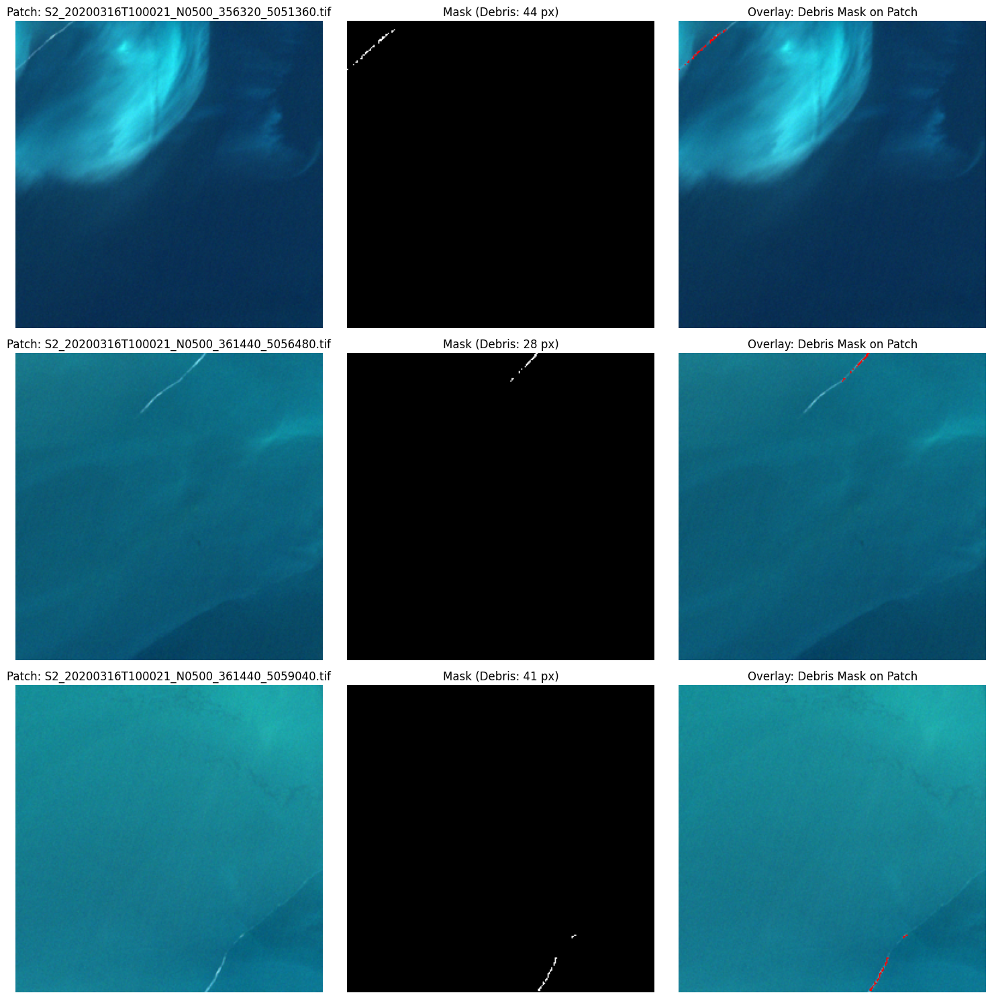

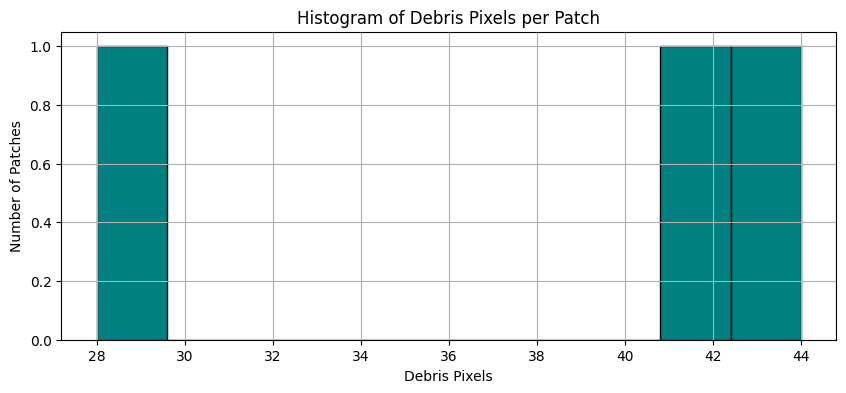

In [49]:
import os
from glob import glob
import numpy as np
import rasterio
import matplotlib.pyplot as plt

# Directories
patch_dir = "/kaggle/working/patches/S2_20200316T100021_N0500"
patch_paths = sorted([p for p in glob(os.path.join(patch_dir, "*.tif")) if not p.endswith("_cl.tif")])
mask_paths = sorted(glob(os.path.join(patch_dir, "*_cl.tif")))

# Ensure both have the same count
print(f"✅ Found {len(patch_paths)} RGB patches and {len(mask_paths)} masks.")

# Visualize
debris_pixel_counts = []
plt.figure(figsize=(15, 5 * len(mask_paths)))

for i, (patch_path, mask_path) in enumerate(zip(patch_paths, mask_paths)):
    with rasterio.open(patch_path) as patch_src:
        if patch_src.count >= 4:
            rgb = patch_src.read([4, 3, 2])
        elif patch_src.count >= 3:
            rgb = patch_src.read([3, 2, 1])
        else:
            band1 = patch_src.read(1)
            rgb = np.stack([band1] * 3)  # replicate grayscale to RGB

        rgb = np.transpose(rgb, (1, 2, 0)).astype(np.float32)
        rgb = (rgb - np.min(rgb)) / (np.max(rgb) - np.min(rgb) + 1e-6)

    with rasterio.open(mask_path) as mask_src:
        mask = mask_src.read(1)
        mask_binary = (mask > 0).astype(np.uint8)

    debris_pixel_counts.append(np.sum(mask_binary))

    # Create red overlay
    overlay = rgb.copy()
    overlay[mask_binary == 1] = [1.0, 0.0, 0.0]  # Red where debris mask exists

    # Plot original patch
    plt.subplot(len(mask_paths), 3, 3*i+1)
    plt.imshow(rgb)
    plt.title(f"Patch: {os.path.basename(patch_path)}")
    plt.axis('off')

    # Plot binary debris mask
    plt.subplot(len(mask_paths), 3, 3*i+2)
    plt.imshow(mask_binary, cmap='gray')
    plt.title(f"Mask (Debris: {int(np.sum(mask_binary))} px)")
    plt.axis('off')

    # Plot overlay
    plt.subplot(len(mask_paths), 3, 3*i+3)
    plt.imshow(overlay)
    plt.title("Overlay: Debris Mask on Patch")
    plt.axis('off')

plt.tight_layout()
plt.show()

# Histogram of debris pixels per patch
plt.figure(figsize=(10, 4))
plt.hist(debris_pixel_counts, bins=10, color='teal', edgecolor='black')
plt.title("Histogram of Debris Pixels per Patch")
plt.xlabel("Debris Pixels")
plt.ylabel("Number of Patches")
plt.grid(True)
plt.show()


In [47]:
upload_to_dagshub('/kaggle/working', '/kaggle/working/patches/S2_20200727T101031_N0500', './LWC_DataSet/test_data', "", dagshub_token=dagshub_token)


uploading files ['/kaggle/working/patches/S2_20200727T101031_N0500/S2_20200727T101031_N0500_356320_5048800.tif', '/kaggle/working/patches/S2_20200727T101031_N0500/S2_20200727T101031_N0500_356320_5048800_cl.tif', '/kaggle/working/patches/S2_20200727T101031_N0500/S2_20200727T101031_N0500_348640_5048800_cl.tif', '/kaggle/working/patches/S2_20200727T101031_N0500/S2_20200727T101031_N0500_356320_5053920.tif', '/kaggle/working/patches/S2_20200727T101031_N0500/S2_20200727T101031_N0500_379360_5056480_cl.tif', '/kaggle/working/patches/S2_20200727T101031_N0500/S2_20200727T101031_N0500_366560_5046240.tif', '/kaggle/working/patches/S2_20200727T101031_N0500/S2_20200727T101031_N0500_356320_5041120.tif', '/kaggle/working/patches/S2_20200727T101031_N0500/S2_20200727T101031_N0500_379360_5056480.tif', '/kaggle/working/patches/S2_20200727T101031_N0500/S2_20200727T101031_N0500_353760_5053920_cl.tif', '/kaggle/working/patches/S2_20200727T101031_N0500/S2_20200727T101031_N0500_366560_5046240_cl.tif', '/kaggle

Uploading files (24) to "sagarbpatel31/Plastic_Debris_Detection_3"...

Upload finished successfully!

Uploaded batch 


In [48]:
import os
import rasterio

def validate_patch_batch(patches_dir):
    patch_files = []
    for root, dirs, files in os.walk(patches_dir):
        for file in files:
            if file.endswith(".tif") and not file.endswith("_cl.tif"):
                patch_files.append(os.path.join(root, file))
    
    print(f"Found {len(patch_files)} patches for validation.\n")

    pass_count = 0
    fail_count = 0

    for patch_path in patch_files:
        with rasterio.open(patch_path) as src:
            bounds = src.bounds
            crs = src.crs
            res = src.res
            width = src.width
            height = src.height

        # Expected width and height based on bounds and resolution
        expected_width = int(round((bounds.right - bounds.left) / res[0]))
        expected_height = int(round((bounds.top - bounds.bottom) / res[1]))

        # Extract UTM coords from filename
        filename = os.path.basename(patch_path)
        try:
            parts = filename.split("_")
            utm_x = int(parts[-2])
            utm_y = int(parts[-1].replace(".tif", ""))
        except Exception as e:
            print(f"⚠️ Error parsing UTM coordinates from filename: {filename} | Error: {e}")
            fail_count += 1
            continue

        # Check 1: CRS should match EPSG:32633
        crs_ok = str(crs) == "EPSG:32633"

        # Check 2: Resolution should be (10.0, 10.0)
        res_ok = (abs(res[0] - 10.0) < 1e-3) and (abs(res[1] - 10.0) < 1e-3)

        # Check 3: Size should be 256x256
        size_ok = (width == 256 and height == 256)

        # Check 4: Bounds should match UTM from filename
        bounds_ok = (
            abs(bounds.left - utm_x) < 1e-3 and
            abs(bounds.bottom - utm_y) < 1e-3 and
            abs(bounds.right - (utm_x + 256 * 10)) < 1e-3 and
            abs(bounds.top - (utm_y + 256 * 10)) < 1e-3
        )

        if crs_ok and res_ok and size_ok and bounds_ok:
            pass_count += 1
        else:
            print(f"🚨 [FAIL] {filename}")
            if not crs_ok: print("  - CRS mismatch")
            if not res_ok: print("  - Resolution mismatch")
            if not size_ok: print("  - Size mismatch")
            if not bounds_ok: print("  - Bounds mismatch")

            print(f"    Bounds from file: {bounds}")
            print(f"    Expected bounds: ({utm_x}, {utm_y}, {utm_x + 2560}, {utm_y + 2560})")
            fail_count += 1

    print("\nValidation Summary:")
    print(f"✅ Passed: {pass_count}")
    print(f"❌ Failed: {fail_count}")

# Example usage
validate_patch_batch("/kaggle/working/patches")

Found 90 patches for validation.


Validation Summary:
✅ Passed: 90
❌ Failed: 0


In [51]:
import os
import rasterio
import numpy as np

def validate_patch_mask_alignment(patches_dir):
    patch_files = []
    for root, dirs, files in os.walk(patches_dir):
        for file in files:
            if file.endswith(".tif") and not file.endswith("_cl.tif"):
                patch_files.append(os.path.join(root, file))
    
    print(f"Found {len(patch_files)} patch-mask pairs to validate.\n")

    pass_count = 0
    fail_count = 0

    for patch_path in patch_files:
        patch_name = os.path.basename(patch_path)[:-4]  # remove ".tiff"
        mask_path = os.path.join(os.path.dirname(patch_path), patch_name + "_cl.tif")

        if not os.path.exists(mask_path):
            print(f"⚠️ Mask not found for {patch_name}")
            fail_count += 1
            continue

        with rasterio.open(patch_path) as patch_src, rasterio.open(mask_path) as mask_src:
            patch_shape = (patch_src.height, patch_src.width)
            mask_shape = (mask_src.height, mask_src.width)

            # Optional: Read data to further verify mask has valid pixel coverage
            patch_data = patch_src.read(1)
            mask_data = mask_src.read(1)

        # Check if dimensions match
        if patch_shape == mask_shape:
            pass_count += 1
        else:
            print(f"🚨 [FAIL] Size mismatch for {patch_name}: Patch {patch_shape}, Mask {mask_shape}")
            fail_count += 1
            continue
        
        # Optional further pixel check:
        # Check if the mask is not blank (has debris labels)
        if np.sum(mask_data) == 0:
            print(f"⚠️ Warning: Mask is blank (no debris labels) for {patch_name}")

    print("\nValidation Summary:")
    print(f"✅ Patch-Mask Size Passed: {pass_count}")
    print(f"❌ Patch-Mask Size Failed: {fail_count}")

# Example usage
validate_patch_mask_alignment("/kaggle/working/patches")

Found 90 patch-mask pairs to validate.


Validation Summary:
✅ Patch-Mask Size Passed: 90
❌ Patch-Mask Size Failed: 0


In [ ]:
/kaggle/input/litter-windrows-batch-5/S2A_MSIL1C_20200727T101031_N0500_R022_T33TUL_20230325T162000/S2A_MSIL1C_20200727T101031_N0500_R022_T33TUL_20230325T162000.SAFE/GRANULE/L1C_T33TUL_A026617_20200727T101605

✅ RGB stack created at: /kaggle/working/stacked_rgb_tile.tif

🔍 Validating 12 patches...



  0%|          | 0/12 [00:00<?, ?it/s]


📍 S2_20200727T101031_N0500_348640_5048800


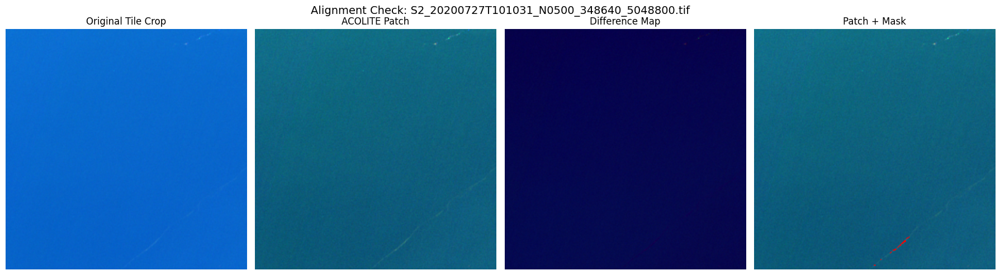

  8%|▊         | 1/12 [00:01<00:14,  1.30s/it]


📍 S2_20200727T101031_N0500_353760_5048800


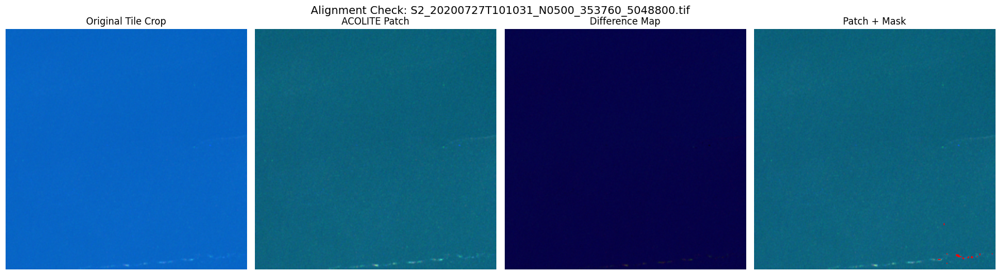

 17%|█▋        | 2/12 [00:02<00:11,  1.11s/it]


📍 S2_20200727T101031_N0500_353760_5053920


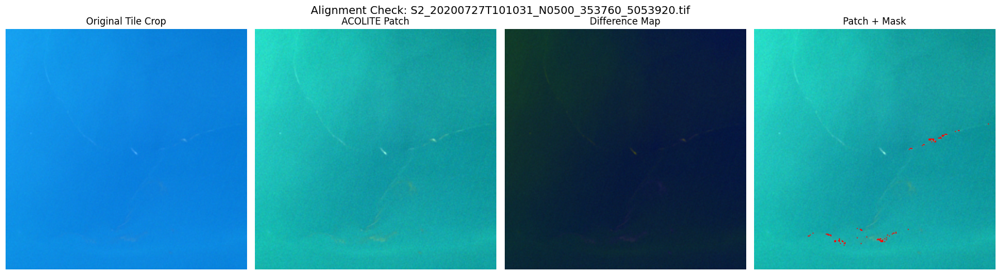

 25%|██▌       | 3/12 [00:03<00:08,  1.00it/s]


📍 S2_20200727T101031_N0500_356320_5038560


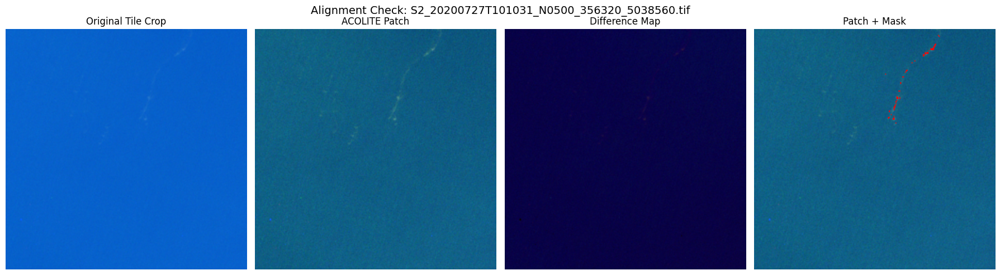

 33%|███▎      | 4/12 [00:04<00:08,  1.00s/it]


📍 S2_20200727T101031_N0500_356320_5041120


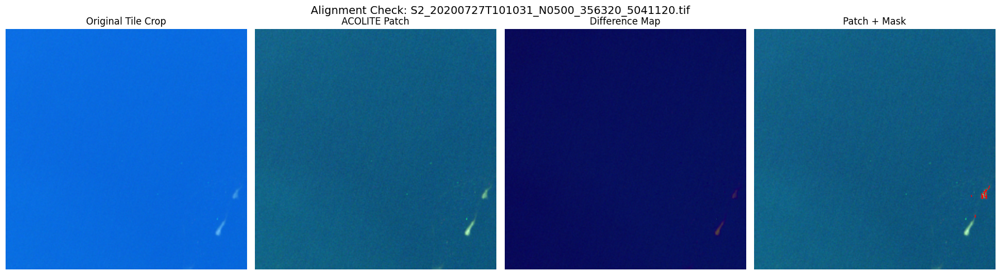

 42%|████▏     | 5/12 [00:05<00:06,  1.05it/s]


📍 S2_20200727T101031_N0500_356320_5048800


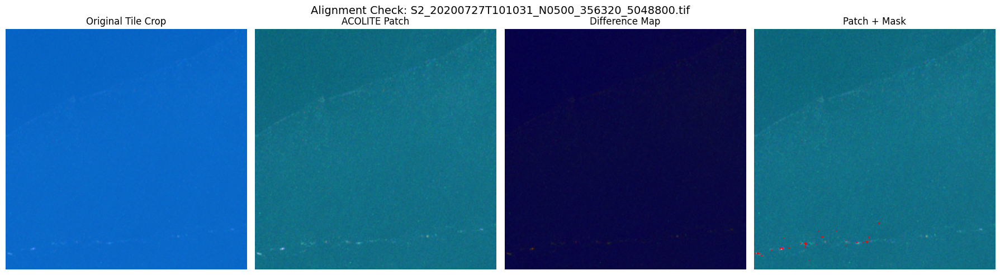

 50%|█████     | 6/12 [00:05<00:05,  1.05it/s]


📍 S2_20200727T101031_N0500_356320_5053920


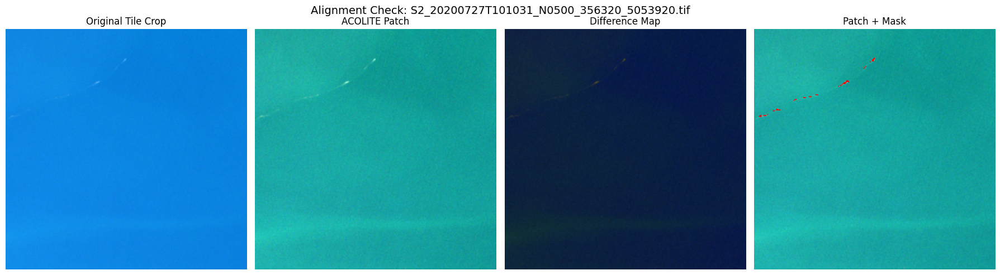

 58%|█████▊    | 7/12 [00:06<00:04,  1.07it/s]


📍 S2_20200727T101031_N0500_356320_5056480


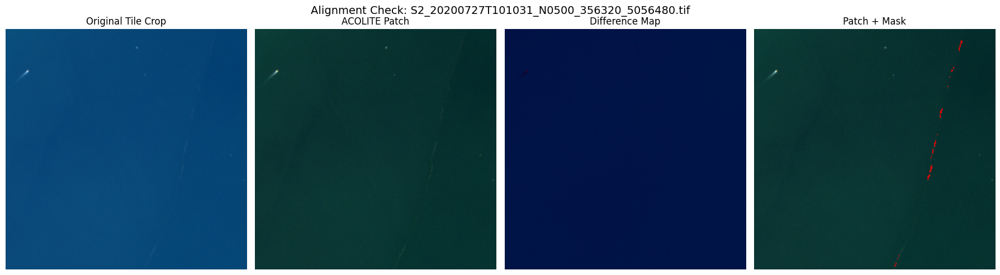

 67%|██████▋   | 8/12 [00:07<00:03,  1.15it/s]


📍 S2_20200727T101031_N0500_361440_5056480


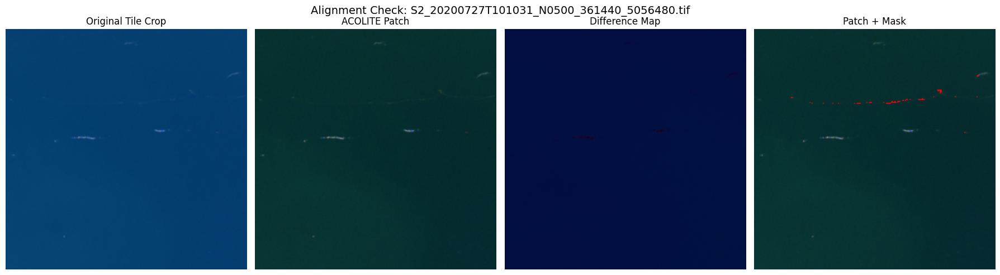

 75%|███████▌  | 9/12 [00:08<00:02,  1.14it/s]


📍 S2_20200727T101031_N0500_366560_5046240


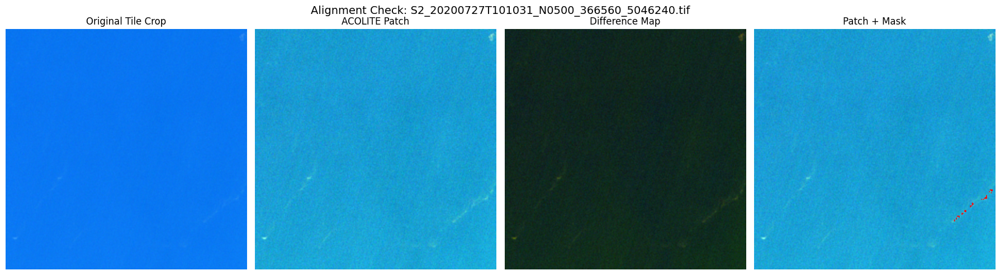

 83%|████████▎ | 10/12 [00:09<00:01,  1.07it/s]


📍 S2_20200727T101031_N0500_369120_5053920


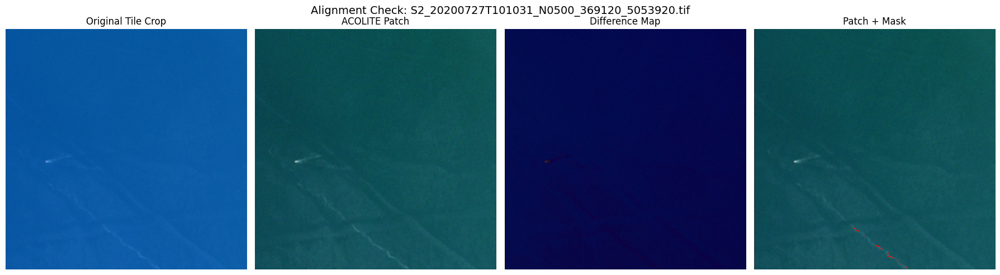

 92%|█████████▏| 11/12 [00:10<00:00,  1.11it/s]


📍 S2_20200727T101031_N0500_379360_5056480


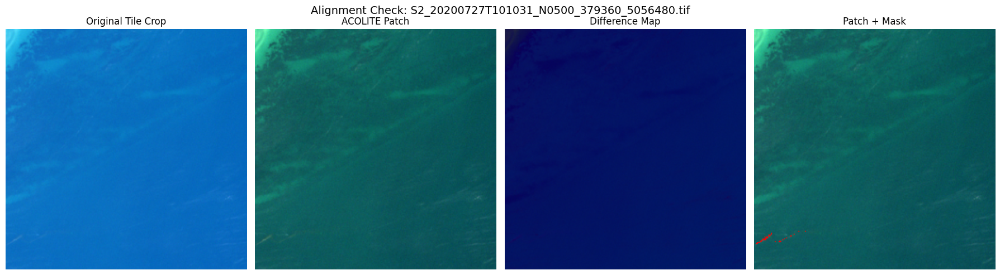

100%|██████████| 12/12 [00:11<00:00,  1.06it/s]


✅ Passed: 12 patches within tile bounds and visualized.


In [61]:
# === STEP 1: Create stacked RGB GeoTIFF from .SAFE folder ===
def build_rgb_stack_from_safe(safe_dir, output_path="stacked_rgb_tile.tif"):
    # Dynamically find IMG_DATA folder
    granule_dirs = glob(os.path.join(safe_dir, "GRANULE/L1C_T33TUL_A026617_20200727T101605/IMG_DATA"))
    if not granule_dirs:
        raise FileNotFoundError("IMG_DATA folder not found inside GRANULE.")
    jp2_dir = granule_dirs[0]

    # Fetch B04, B03, B02 (Red, Green, Blue)
    band_paths = {
        "B04": glob(os.path.join(jp2_dir, "*B04.jp2"))[0],  # Red
        "B03": glob(os.path.join(jp2_dir, "*B03.jp2"))[0],  # Green
        "B02": glob(os.path.join(jp2_dir, "*B02.jp2"))[0],  # Blue
    }

    arrays = []
    meta = None
    for band in ["B04", "B03", "B02"]:  # RGB order
        with rasterio.open(band_paths[band]) as src:
            arrays.append(src.read(1))
            if meta is None:
                meta = src.meta.copy()

    stacked = np.stack(arrays)
    meta.update({"count": 3, "dtype": "uint16"})

    with rasterio.open(output_path, "w", **meta) as dst:
        dst.write(stacked)

    print(f"✅ RGB stack created at: {output_path}")
    return output_path

# === STEP 2: Visual Validation ===
def crop_tile(tile_src, bounds):
    try:
        window = from_bounds(*bounds, transform=tile_src.transform)
        tile_crop = tile_src.read([1, 2, 3], window=window)
        tile_crop = np.transpose(tile_crop, (1, 2, 0)).astype(np.float32)
        tile_crop = (tile_crop - tile_crop.min()) / (tile_crop.max() - tile_crop.min() + 1e-6)
        return tile_crop
    except Exception as e:
        print(f"❌ Error cropping tile: {e}")
        return None

def read_patch_rgb(patch_path):
    with rasterio.open(patch_path) as src:
        if src.count >= 4:
            rgb = src.read([4, 3, 2])
        elif src.count >= 3:
            rgb = src.read([3, 2, 1])
        else:
            band = src.read(1)
            rgb = np.stack([band] * 3)
        rgb = np.transpose(rgb, (1, 2, 0)).astype(np.float32)
        rgb = (rgb - rgb.min()) / (rgb.max() - rgb.min() + 1e-6)
        return rgb

def read_mask(mask_path):
    with rasterio.open(mask_path) as src:
        return (src.read(1) > 0).astype(np.uint8)

def visualize_all(patch_rgb, tile_crop, mask, patch_path):
    diff = np.abs(patch_rgb - tile_crop)

    plt.figure(figsize=(18, 5))
    plt.suptitle(f"Alignment Check: {os.path.basename(patch_path)}", fontsize=14)

    plt.subplot(1, 4, 1)
    plt.imshow(tile_crop)
    plt.title("Original Tile Crop")
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.imshow(patch_rgb)
    plt.title("ACOLITE Patch")
    plt.axis('off')

    plt.subplot(1, 4, 3)
    plt.imshow(diff)
    plt.title("Difference Map")
    plt.axis('off')

    plt.subplot(1, 4, 4)
    overlay = patch_rgb.copy()
    overlay[mask == 1] = [1.0, 0.0, 0.0]
    plt.imshow(overlay)
    plt.title("Patch + Mask")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# === STEP 3: Validate Patch-Mask vs Tile ===
def validate_patch_alignment(patch_dir, stacked_tile_path):
    patch_paths = sorted([p for p in glob(os.path.join(patch_dir, "*.tif")) if not p.endswith("_cl.tif")])
    print(f"\n🔍 Validating {len(patch_paths)} patches...\n")

    with rasterio.open(stacked_tile_path) as tile_src:
        tile_bounds = tile_src.bounds
        tile_crs = tile_src.crs

        passed = 0
        for patch_path in tqdm(patch_paths):
            patch_name = os.path.basename(patch_path)[:-4]
            mask_path = os.path.join(patch_dir, patch_name + "_cl.tif")
            with rasterio.open(patch_path) as patch_src:
                patch_bounds = patch_src.bounds
                patch_crs = patch_src.crs

                print(f"\n📍 {patch_name}")
                if patch_crs != tile_crs:
                    print(f"❌ CRS mismatch: {patch_crs} vs {tile_crs}")
                    continue

                within_bounds = (
                    tile_bounds.left <= patch_bounds.left <= tile_bounds.right and
                    tile_bounds.right >= patch_bounds.right and
                    tile_bounds.bottom <= patch_bounds.bottom <= tile_bounds.top and
                    tile_bounds.top >= patch_bounds.top
                )
                if not within_bounds:
                    print(f"🚫 Patch is out of bounds of original tile!")
                    continue

                patch_rgb = read_patch_rgb(patch_path)
                tile_crop = crop_tile(tile_src, patch_bounds)
                mask = read_mask(mask_path) if os.path.exists(mask_path) else np.zeros(patch_rgb.shape[:2], dtype=np.uint8)

                visualize_all(patch_rgb, tile_crop, mask, patch_path)
                passed += 1

        print(f"\n✅ Passed: {passed} patches within tile bounds and visualized.")

# === RUN ===

# 1. Generate stacked RGB tile from SAFE
safe_path = "/kaggle/input/litter-windrows-batch-5/S2A_MSIL1C_20200727T101031_N0500_R022_T33TUL_20230325T162000/S2A_MSIL1C_20200727T101031_N0500_R022_T33TUL_20230325T162000.SAFE"
stacked_tile_path = build_rgb_stack_from_safe(safe_path, output_path="/kaggle/working/stacked_rgb_tile.tif")

# 2. Validate patches and masks
validate_patch_alignment(
    patch_dir="/kaggle/working/patches/S2_20200727T101031_N0500",
    stacked_tile_path=stacked_tile_path
)
